<a href="https://colab.research.google.com/github/pauljohn99/ML-learnings/blob/main/smile_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp39-cp39-linux_x86_64.whl size=44089 sha256=9d6d8a89f56b29fcc423b54663d4f953733ea427b07ea5a62026e5a1dc835e1e
  Stored in directory: /root/.cache/pip/wheels/68/be/8f/b6c454cd264e0b349b47f8ee00755511f277618af9e5dae20d
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flax 0.6.8 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61429 sha256=2715cc45f6b96690d6e298cf9a6d9092bb181911c7ca12413917d0518f25be95
  Stored in directory: /root/.cache/pip/wheels/83/42/02/66178d16e5c44dc26d309931834956baeda371956e86fbd876
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144573 sha256=2847fecaa7b53eb5494aa8dd75f974

In [2]:
!pip install mediapipe==0.8.10.1
!pip install numpy==1.19.5
!pip install opencv-contrib-python==4.6.0.66
!pip install opencv-python==4.5.5.64
!pip install Pillow==9.0.0
!pip install scipy==1.9.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.9/32.9 MB 31.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.9/14.9 MB 45.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 2022.12.0 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
xarray-einstats 0.5.1 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.19.5 which is incompatible.
pandas 1.5.3 requires numpy>=1.20.3; p

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

In [5]:
import cv2
import mediapipe as mp
import pathlib
import numpy as np
from PIL import Image,ImageDraw
import os
from subprocess import call
import sys
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
import numpy as np
from scipy.interpolate import interp1d
from scipy.spatial.distance import euclidean
import urllib.request
from google.colab.patches import cv2_imshow



In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
downloaded_image="/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg"
ordered_upper_teeth_index,ordered_lower_teeth_index,detected_tooth_data,x_face_centre,x_centroid_points,face_mesh_point=getting_detected_tooth_data(downloaded_image)
print("ordered_upper_teeth_index=",ordered_upper_teeth_index)
print("ordered_lower_teeth_index=",ordered_lower_teeth_index)
print("detected_tooth_data=",detected_tooth_data)
print("x_face_centre=",x_face_centre)
print("x_centroid_points=",x_centroid_points)
print("face_mesh_point=",face_mesh_point)

[04/12 08:58:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/model_final.pth ...


/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


ordered_upper_teeth_index= [2, 4, 3, 0, 5, 1, 6, 7, 10, 9, 8]
ordered_lower_teeth_index= []
detected_tooth_data= {'instances': Instances(num_instances=11, image_height=1680, image_width=2520, fields=[pred_boxes: Boxes(tensor([[1029.0905, 1041.2334, 1073.7557, 1107.5997],
        [ 987.4262, 1039.3553, 1027.9246, 1098.7030],
        [1144.0491, 1030.8054, 1212.2336, 1118.7507],
        [1212.5800, 1030.1255, 1256.3800, 1100.7141],
        [1073.6637, 1033.3663, 1142.3309, 1120.7567],
        [1255.5697, 1027.1836, 1296.5785, 1098.6884],
        [1292.6515, 1026.8718, 1323.7360, 1088.7737],
        [ 964.3118, 1037.7816,  991.7289, 1088.3882],
        [ 945.8320, 1036.7246,  972.0651, 1071.3309],
        [1327.6912, 1024.4609, 1361.2396, 1066.5389],
        [ 950.4320, 1036.2782,  987.0024, 1080.2013]])), scores: tensor([0.9779, 0.9778, 0.9761, 0.9753, 0.9747, 0.9589, 0.9554, 0.8935, 0.8295,
        0.7560, 0.7505]), pred_classes: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), pred_masks: te

In [8]:
def getting_detected_tooth_data(downloaded_image):
    face_mesh_point=face_mesh_points(downloaded_image)
    predictor=model_load()
    detected_tooth_data=teeth_detection(predictor,downloaded_image)
    centroid_points=finding_tooth_centroid(detected_tooth_data)
    b_box=get_b_box(detected_tooth_data)
    teeth_upper_x,teeth_upper_y=find_teeth_upper_cordinates(b_box)
    max_box_x,max_box_y=find_boxs_max_cordinates(teeth_upper_x,teeth_upper_y)
    x_face_centre,y_face_centre=find_midline_cordinates(downloaded_image,face_mesh_point)
    x_centroid_points,y_centroid_points=seperate_xy_centroid_points(centroid_points)
    distance_centroidPoints_faceMidline=distance_between_points(x_centroid_points,x_face_centre)
    upper_lip_x,upper_lip_y,upper_lip_cordinates=detect_upper_lip_points(downloaded_image,face_mesh_point)
    ascending_lip_x=convert_to_ascending_order(upper_lip_x)
    ascending_lip_y,ascending_upper_lip=convert_lip_point_to_ascending(ascending_lip_x,upper_lip_cordinates)
    distance_teeth_upper_maxPoint_lip=distance_between_curve_and_line(max_box_x,max_box_y,ascending_lip_x,ascending_lip_y)
    lip_height,lip_width=find_lip_size(downloaded_image,face_mesh_point)
    y_line_below_upper_lip=newline_below_lip(lip_height,ascending_lip_y,distance_teeth_upper_maxPoint_lip)
    upper_teeth_x,lower_teeth_x=distinguish_upper_lower_teeth(upper_lip_x,y_line_below_upper_lip,teeth_upper_x,teeth_upper_y)
    upper_teeth_index,lower_teeth_index=find_index(upper_teeth_x,lower_teeth_x,teeth_upper_x)
    ascending_distance_centroidPoints_faceMidline_index=order_by_index_smallest_distance(distance_centroidPoints_faceMidline)
    ordered_upper_teeth_index,ordered_lower_teeth_index=order_teeth(upper_teeth_index,lower_teeth_index,ascending_distance_centroidPoints_faceMidline_index)
    return ordered_upper_teeth_index,ordered_lower_teeth_index,detected_tooth_data,x_face_centre,x_centroid_points,face_mesh_point

In [9]:
def face_mesh_points(downloaded_image):
    rgb=cv2.imread(downloaded_image)
    face_mesh_detector = mp.solutions.face_mesh   
    face_mesh = face_mesh_detector.FaceMesh(static_image_mode=True,refine_landmarks=True,max_num_faces=1,min_detection_confidence=0.5)
    face_mesh_point = face_mesh.process(rgb)
    return(face_mesh_point)

In [10]:
def create_config():
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.DATASETS.TRAIN = ("teeth_train",)
    cfg.DATASETS.TEST = ()
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
    cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
    cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
    cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
    cfg.SOLVER.STEPS = []        # do not decay learning rate
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
    # NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
    return cfg


def model_load():
    cfg=create_config()
    # Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
    cfg.MODEL.WEIGHTS = os.path.join("/content/drive/MyDrive/model_final.pth")  # path to the model we just trained
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
    cfg.MODEL.DEVICE = "cpu"
    predictor = DefaultPredictor(cfg)
    return predictor


def teeth_detection(predictor,downloaded_image):
    im = cv2.imread(downloaded_image)
    detected_tooth_data = predictor(im)
    return detected_tooth_data


In [11]:

def finding_tooth_centroid(detected_tooth_data):
    contours = []
    for pred_mask in detected_tooth_data['instances'].pred_masks:
        # pred_mask is of type torch.Tensor, and the values are boolean (True, False)
        # Convert it to a 8-bit numpy array, which can then be used to find contours
        mask = pred_mask.cpu().numpy().astype('uint8')
        contour, _ = cv2.findContours(mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        contours.append(contour[0]) 
        centroid_points=[]
        for cont in contours:
            centroid_points.append(find_polygon_centroid(cont))
    return centroid_points


def get_b_box(detected_tooth_data):
    b_box=detected_tooth_data['instances'].pred_boxes.tensor
    return b_box    



def find_teeth_upper_cordinates(b_box):
    teeth_upper_x=[]
    teeth_upper_y=[]
    boxes=b_box.cpu().numpy()
    for boxs in boxes:
        teeth_upper_y.append(boxs[1])
        teeth_upper_x.append(boxs[0]+(boxs[2]-boxs[0])/2)
    return teeth_upper_x,teeth_upper_y



def find_polygon_centroid(points):
    n = len(points)
    area = 0.0
    x = 0.0
    y = 0.0
    for i in range(n):
        j = (i + 1) % n
        area += points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1]
        x += (points[i][0][0] + points[j][0][0]) * (points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1])
        y += (points[i][0][1] + points[j][0][1]) * (points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1])
    area *= 0.5
    x /= 6 * area
    y /= 6 * area
    return (x, y)



def find_boxs_max_cordinates(teeth_upper_x,teeth_upper_y):
    max_y=min(teeth_upper_y)
    i=teeth_upper_y.index(max_y)
    max_x=teeth_upper_x[i]
    return max_x,max_y



def find_midline_cordinates(downloaded_image,face_mesh_point):
    im=cv2.imread(downloaded_image)
    height, width, _ = im.shape  
    sum=0
    sum1=0
    midline=[19,94,2,164,0,11,12,13,14,15,16,17,18,200,199,175,152]
    for i in face_mesh_point.multi_face_landmarks:
      for j in midline:
        pt1 = i.landmark[j]
        x = int(pt1.x*width)
        y = int(pt1.y*height)
        sum=sum+x
        sum1=sum1+y
    x_face_centre=sum/17
    y_face_centre=sum1/17
    return x_face_centre,y_face_centre



def seperate_xy_centroid_points(centroid_points):
    x_centroid_points=[]
    y_centroid_points=[]
    for cent in centroid_points:
        x_centroid_points.append(cent[0])
    for cent in centroid_points:
        x_centroid_points.append(cent[1])
    return x_centroid_points,y_centroid_points     



def distance_between_points(x_centroid_points,x_face_centre):
    x_centroid_points = np.asarray(x_centroid_points)
    distance_centroid_points_from_face_centre = (np.abs(x_centroid_points - x_face_centre))
    return distance_centroid_points_from_face_centre    



def detect_upper_lip_points(downloaded_image,face_mesh_point):
    im=cv2.imread(downloaded_image)
    height, width, _ = im.shape 
    upper_lip_cordinates=[]
    upper_lip_x=[]
    upper_lip_y=[]
    lip_points=[308,78,191,80,81,82,13,312,311,310,415] 
    for facial_landmarks in face_mesh_point.multi_face_landmarks:
      for i in lip_points:
            pt1 = facial_landmarks.landmark[i]
            x = int(pt1.x * width)
            y = int(pt1.y * height)
            upper_lip_cordinates.append((x,y))
            upper_lip_x.append(x)
            upper_lip_y.append(y)
    return upper_lip_x,upper_lip_y,upper_lip_cordinates



def convert_to_ascending_order(upper_lip_x):
    ascending_lip_x=upper_lip_x.copy()
    for i in range(0, len(ascending_lip_x)):    
        for j in range(i+1, len(ascending_lip_x)):    
            if(ascending_lip_x[i] > ascending_lip_x[j]):    
                temp = ascending_lip_x[i];    
                ascending_lip_x[i] = ascending_lip_x[j];    
                ascending_lip_x[j] = temp; 
    return ascending_lip_x



def convert_lip_point_to_ascending(ascending_lip_x,upper_lip_cordinates):
    ascending_upper_lip=[]
    for i in ascending_lip_x:
        for j in upper_lip_cordinates:
            if(i==j[0]):
                ascending_upper_lip.append(j)
    ascending_lip_y=[]
    for a in ascending_upper_lip:
        ascending_lip_y.append(a[1])  
    return ascending_lip_y,ascending_upper_lip            



def distance_between_curve_and_line(max_box_x,max_box_y,ascending_lip_x,ascending_lip_y):
    # Define x and y coordinates of the curve
    x_curve = ascending_lip_x
    y_curve = ascending_lip_y
    # Define the point
    x_point = max_box_x
    y_point = max_box_y
    # Interpolate the curve to get a function that maps x to y
    f1 = interp1d(x_curve, y_curve)
    # Evaluate the function at the given x-coordinate to find the y-coordinate on the curve
    y_nearest = f1(x_point)
    # Calculate the distance between the point and the nearest point on the curve
    distance_btw_max_teeth_upper_point_and_lip = euclidean([x_point, y_point], [x_point, y_nearest])
    return distance_btw_max_teeth_upper_point_and_lip



def find_lip_size(downloaded_image,face_mesh_point):
    im=cv2.imread(downloaded_image)
    height, width, _ = im.shape  
    for facial_landmarks in face_mesh_point.multi_face_landmarks:    
        sumx=[]
        sumy=[]
        for i in range(0,462):
            if(i==308 or i==78):
                pt1 = facial_landmarks.landmark[i]
                x = int(pt1.x * width)
                sumx.append(x)               
            if(i==14 or i==13):
                pt1 = facial_landmarks.landmark[i]
                y = int(pt1.y * height)
                x=int(pt1.x * width)
                sumy.append(y)
    lip_width=abs(sumx[1]-sumx[0])
    lip_height=abs(sumy[1]-sumy[0])
    return lip_height,lip_width



def newline_below_lip(lip_height,ascending_lip_y,distance_teeth_upper_maxPoint_lip):
    y_line_below_upperlip=[]
    for l in ascending_lip_y:
        y_line_below_upperlip.append(l+lip_height/4+distance_teeth_upper_maxPoint_lip)
    return y_line_below_upperlip



def distinguish_upper_lower_teeth(upper_lip_x,y_line_below_upper_lip,teeth_upper_x,teeth_upper_y):
    x_curve = upper_lip_x
    y_curve = y_line_below_upper_lip
    upper_teeth_x=[]
    lower_teeth_x=[]

    for i in range(len(teeth_upper_x)):
        # Define the point
        x_point = teeth_upper_x[i]
        y_point = teeth_upper_y[i]
        # Interpolate the curve to get a function that maps x to y
        f2 = interp1d(x_curve, y_curve)
        # Evaluate the function at the given x-coordinate to find the y-coordinate on the curve
        y_nearest = f2(x_point)
        yxx=y_nearest-y_point
        if(yxx>=0):
            upper_teeth_x.append(x_point)
        if(yxx<0):
            lower_teeth_x.append(x_point) 
    return  upper_teeth_x,lower_teeth_x        



def find_index(upper_teeth_x,lower_teeth_x,teeth_upper_x):
    upper_teeth_index=[]
    lower_teeth_index=[] 
    for i in lower_teeth_x:
        lower_teeth_index.append(teeth_upper_x.index(i))         
    for i in upper_teeth_x:
        upper_teeth_index.append(teeth_upper_x.index(i))
    return upper_teeth_index,lower_teeth_index


def order_by_index_smallest_distance(distance_centroidPoints_faceCentrePoint):
    ordered_distance_index=[]
    dist_index=distance_centroidPoints_faceCentrePoint.copy()
    for i in range(0,len(dist_index)):
        a=dist_index.argmin()
        ordered_distance_index.append(a)
        dist_index[a]=float('inf')
    return ordered_distance_index    


def order_teeth(upper_teeth_index,lower_teeth_index,ascending_distance_centroidPoints_faceMidline_index):
    upperord=[]
    downord=[]
    for i in ascending_distance_centroidPoints_faceMidline_index:
        for j in upper_teeth_index:
            if(i==j):
                upperord.append(i)
        for s in lower_teeth_index:
            if(i==s):
                downord.append(i)  
    return upperord,downord            



def find_required_teeth_bbox(ordered_upper_teeth_index,detected_tooth_data):
    bboxmaxss=detected_tooth_data['instances'][ordered_upper_teeth_index[0].item()].pred_boxes.tensor
    required_upper_teeth_bbox=bboxmaxss.cpu().numpy()[0]
    return required_upper_teeth_bbox



def find_scaling_factor(required_upper_teeth_bbox):
    xs1=required_upper_teeth_bbox[2].item()-required_upper_teeth_bbox[0].item()
    ys1=required_upper_teeth_bbox[3].item()-required_upper_teeth_bbox[1].item()
    xs2=667-517
    ys2=270-104
    x_scale=xs1/xs2
    y_scale=ys1/ys2
    return x_scale,y_scale





In [19]:
print("ordered_upper_teeth_index=",ordered_upper_teeth_index)
print("ordered_lower_teeth_index=",ordered_lower_teeth_index)
print("detected_tooth_data=",detected_tooth_data)
print("x_centroid_points=",x_centroid_points)
print("x_face_centre=",x_face_centre)

ordered_upper_teeth_index= [2, 4, 3, 0, 5, 1, 6, 7, 10, 9, 8]
ordered_lower_teeth_index= []
detected_tooth_data= {'instances': Instances(num_instances=11, image_height=1680, image_width=2520, fields=[pred_boxes: Boxes(tensor([[1029.0905, 1041.2334, 1073.7557, 1107.5997],
        [ 987.4262, 1039.3553, 1027.9246, 1098.7030],
        [1144.0491, 1030.8054, 1212.2336, 1118.7507],
        [1212.5800, 1030.1255, 1256.3800, 1100.7141],
        [1073.6637, 1033.3663, 1142.3309, 1120.7567],
        [1255.5697, 1027.1836, 1296.5785, 1098.6884],
        [1292.6515, 1026.8718, 1323.7360, 1088.7737],
        [ 964.3118, 1037.7816,  991.7289, 1088.3882],
        [ 945.8320, 1036.7246,  972.0651, 1071.3309],
        [1327.6912, 1024.4609, 1361.2396, 1066.5389],
        [ 950.4320, 1036.2782,  987.0024, 1080.2013]])), scores: tensor([0.9779, 0.9778, 0.9761, 0.9753, 0.9747, 0.9589, 0.9554, 0.8935, 0.8295,
        0.7560, 0.7505]), pred_classes: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), pred_masks: te

In [ ]:
# Incisal plane

In [20]:
right_upper,left_upper=upper_left_right(ordered_upper_teeth_index,x_centroid_points,x_face_centre)

[2, 3, 5, 6, 9] [4, 0, 1, 7, 10, 8]


In [21]:
x_left,x_right,y_left,y_right=incisal_plane(right_upper,left_upper,detected_tooth_data)
print(x_left,x_right,y_left,y_right)

1011 1277 1097 1097


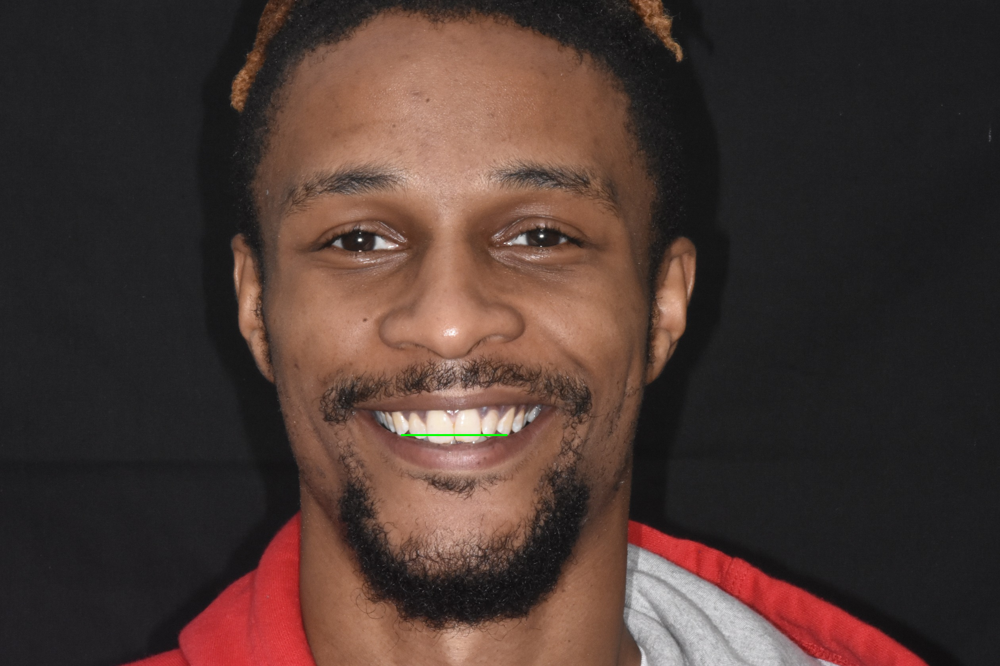

In [22]:
img=cv2.imread(downloaded_image)
image=cv2.line(img, (x_left,y_left), (x_right,y_right), (0,255,0), 3) 
cv2_imshow(image)

In [23]:
def upper_left_right(ordered_upper_teeth_index,x_centroid_points,x_face_centre):
  right_upper=[]
  left_upper=[]
  for teeth in ordered_upper_teeth_index:
    if(x_centroid_points[teeth]>=x_face_centre):
      right_upper.append(teeth)
    else:
      left_upper.append(teeth)  
  print(right_upper,left_upper)
  return right_upper,left_upper

In [24]:
def incisal_plane(right_upper,left_upper,detected_tooth_data):
  x1=left_upper[2]
  x2=right_upper[2]
  pred_mask=detected_tooth_data['instances'].pred_masks
  teeth_1=np.argwhere(pred_mask[x1])
  teeth_2=np.argwhere(pred_mask[x2])
  y_left=max(teeth_1[0])
  y_right=max(teeth_2[0])
  yindex1=(teeth_1[0] == y_left).nonzero(as_tuple=True)[0]
  yindex2=(teeth_2[0] == y_right).nonzero(as_tuple=True)[0]
  xp1=teeth_1[1][yindex1]
  xp2=teeth_2[1][yindex2]
  x_left=min(xp1).item()
  x_right=max(xp2).item()
  y_left=y_left.item()
  y_right=y_right.item()
  return  x_left,x_right,y_left,y_right 

In [ ]:
# Central incisor width/ length ratio

In [34]:
box_left,box_right=Central_incisor_width_length_ratio(right_upper,left_upper,detected_tooth_data)
print(box_left,box_right)

tensor([1073.6637, 1033.3663, 1142.3309, 1120.7567]) tensor([1144.0491, 1030.8054, 1212.2336, 1118.7507])


In [35]:
left_central_incisor_ratio=box_ratio(box_left)
right_central_incisor_ratio=box_ratio(box_right)
print(right_central_incisor_ratio.item())

0.7753064632415771


In [26]:
def Central_incisor_width_length_ratio(right_upper,left_upper,detected_tooth_data):
  b_box=detected_tooth_data['instances'].pred_boxes.tensor
  box_left=b_box[left_upper[0]]
  box_right=b_box[right_upper[0]]
  return box_left,box_right

In [27]:
def box_ratio(box):
  ratio=(box[0]-box[2])/(box[1]-box[3])
  return ratio

In [ ]:
# Interdental width proportion

In [28]:
def grill(right_upper,left_upper,detected_tooth_data,face_mesh_point,downloaded_image):
  b_box=detected_tooth_data['instances'].pred_boxes.tensor
  lci=b_box[left_upper[0]]
  lli=b_box[left_upper[1]]
  lcan=b_box[left_upper[2]]
  wlci=lci[2]-lci[0]
  wlli=lli[2]-lli[0]
  wlcan=lcan[2]-lcan[0]
  ratio_lci=wlci/wlli
  ratio_lli=1
  ratio_lcan=wlcan/wlli
  x_lval=(lcan[0],lcan[2],lli[0],lli[2],lci[0],lci[2])
  rci=b_box[right_upper[0]]
  rli=b_box[right_upper[1]]
  rcan=b_box[right_upper[2]]
  wrci=rci[2]-rci[0]
  wrli=rli[2]-rli[0]
  wrcan=rcan[2]-rcan[0]
  ratio_rci=wrci/wrli
  ratio_rli=1
  ratio_rcan=wrcan/wrli
  x_rval=(rci[0],rci[2],rli[0],rli[2],rcan[0],rcan[2])
  combine_lr=x_lval+x_rval
  y_cord=y_top_bot(face_mesh_point,downloaded_image)
  final_cordinates=final_cord(combine_lr,y_cord)
  # return ratio_lci,ratio_lli,ratio_lcan,x_lval,ratio_rci,ratio_rli,ratio_rcan,x_rval
  return final_cordinates,ratio_lci,ratio_lli,ratio_lcan,ratio_rci,ratio_rli,ratio_rcan

In [36]:
# ratio_lci,ratio_lli,ratio_lcan,x_lval,ratio_rci,ratio_rli,ratio_rcan,x_rval,=grill(right_upper,left_upper,detected_tooth_data,face_mesh_point,downloaded_image)
# print(ratio_lci,ratio_lli,ratio_lcan)
# print(x_rval)


NameError: ignored

In [30]:
image=cv2.imread(downloaded_image)

In [31]:
def y_top_bot(face_mesh_point,downloaded_image):
  im=cv2.imread(downloaded_image)
  height, width, _ = im.shape 
  y_cord=[]
  for facial_landmarks in face_mesh_point.multi_face_landmarks:
        for i in range(0,462):
              if(i==14 or i==12):
                  pt1 = facial_landmarks.landmark[i]
                  y = int(pt1.y * height)
                  y_cord.append(y)
  return y_cord

In [32]:
# combine_lr=x_lval+x_rval
# print(combine_lr)

NameError: ignored

In [37]:
def final_cord(combine_lr,y_cord):  
  cordinates=[]
  for i in combine_lr:
    cord=[]
    for j in y_cord:
        cord.append((int(i.item()),j))
    cordinates.append(cord)
  return cordinates

In [38]:
final_cordinates,ratio_lci,ratio_lli,ratio_lcan,ratio_rci,ratio_rli,ratio_rcan=grill(right_upper,left_upper,detected_tooth_data,face_mesh_point,downloaded_image)

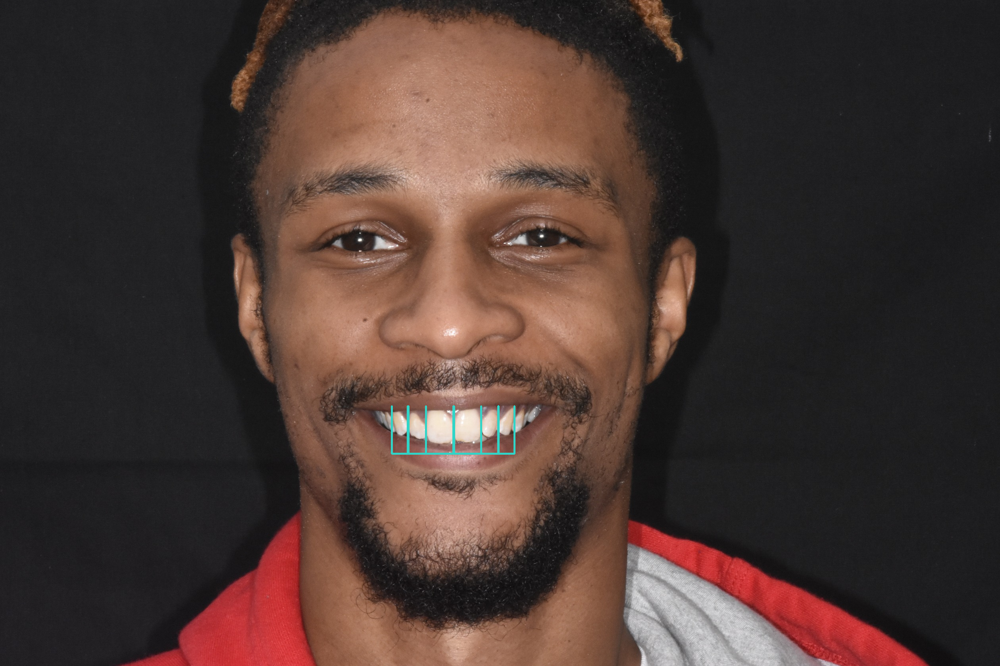

In [42]:
for k in final_cordinates:
  image=cv2.line(image, k[0], k[1], (200,213,48), 3) 
image=cv2.line(image, final_cordinates[0][1], final_cordinates[-1][1], (200,213,48), 3)
cv2_imshow(image) 

In [ ]:
# Smile curve

In [43]:
print(right_upper,left_upper)

[2, 3, 5, 6, 9] [4, 0, 1, 7, 10, 8]


In [44]:
b_box=detected_tooth_data['instances'].pred_boxes.tensor
print(b_box)

tensor([[1029.0905, 1041.2334, 1073.7557, 1107.5997],
        [ 987.4262, 1039.3553, 1027.9246, 1098.7030],
        [1144.0491, 1030.8054, 1212.2336, 1118.7507],
        [1212.5800, 1030.1255, 1256.3800, 1100.7141],
        [1073.6637, 1033.3663, 1142.3309, 1120.7567],
        [1255.5697, 1027.1836, 1296.5785, 1098.6884],
        [1292.6515, 1026.8718, 1323.7360, 1088.7737],
        [ 964.3118, 1037.7816,  991.7289, 1088.3882],
        [ 945.8320, 1036.7246,  972.0651, 1071.3309],
        [1327.6912, 1024.4609, 1361.2396, 1066.5389],
        [ 950.4320, 1036.2782,  987.0024, 1080.2013]])


In [75]:
all_x=[]
for i in range(0,3):
  left_point_x=b_box[left_upper[2-i]][0]
  all_x.append(left_point_x.item())  
for i in range(0,3):
  right_point_x=b_box[right_upper[i]][2]
  all_x.append(right_point_x.item())
print(all_x)    

[987.4262084960938, 1029.0904541015625, 1073.6636962890625, 1212.233642578125, 1256.3800048828125, 1296.5784912109375]


In [76]:
all_y=[]
for i in range(0,3):
  left_point_y=b_box[left_upper[2-i]][3]
  all_y.append(left_point_y.item())  
for i in range(0,3):
  right_point_y=b_box[right_upper[i]][3]
  all_y.append(right_point_y.item())
print(all_y) 

[1098.7030029296875, 1107.5997314453125, 1120.7567138671875, 1118.750732421875, 1100.714111328125, 1098.6883544921875]


In [77]:
combine=[]
for i in range(len(all_x)):
  combine.append((all_x[i],all_y[i]))
print(combine)

[(987.4262084960938, 1098.7030029296875), (1029.0904541015625, 1107.5997314453125), (1073.6636962890625, 1120.7567138671875), (1212.233642578125, 1118.750732421875), (1256.3800048828125, 1100.714111328125), (1296.5784912109375, 1098.6883544921875)]


[[ 987 1098]
 [1029 1107]
 [1073 1120]
 [1212 1118]
 [1256 1100]
 [1296 1098]]


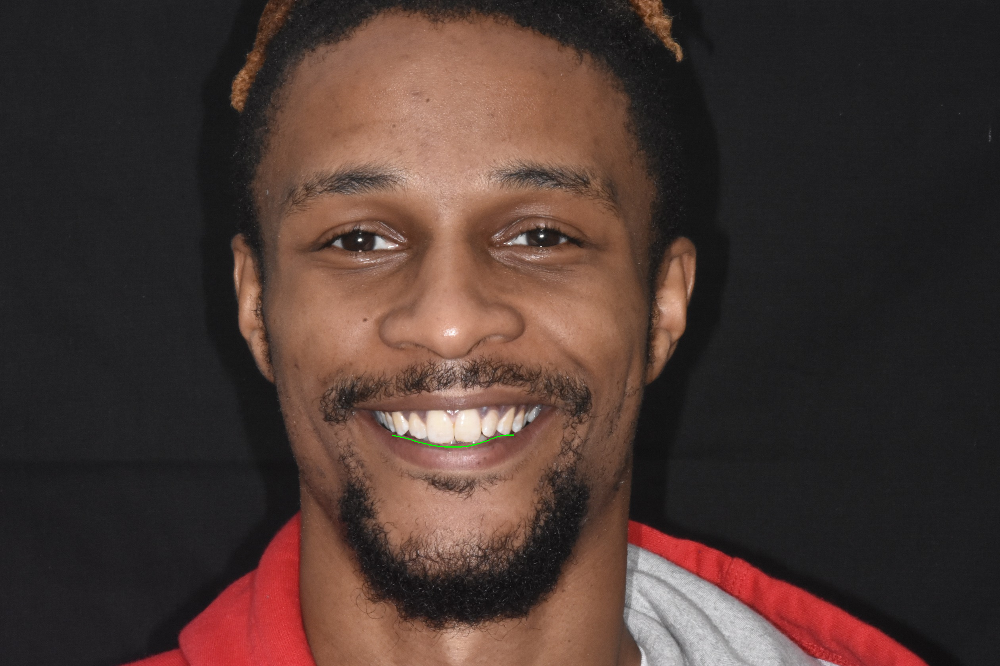

In [85]:
import cv2
import numpy as np

# Load the image
img = cv2.imread(downloaded_image)

# Define the six points of the curve
pts = (combine)
pts = np.array(pts, dtype=np.int32)
print(pts)

tck, u = splprep(pts.T, k=2, s=2)
u_new = np.linspace(u.min(), u.max(), 100)
x_new, y_new = splev(u_new, tck, der=0)
pts_new = np.column_stack((x_new, y_new)).astype(np.int32)

# Draw the curve on the image
cv2.polylines(img, [pts_new], False, (0, 255, 0), thickness=2)

# Display the image
cv2_imshow(img) 
cv2.waitKey(0)
cv2.destroyAllWindows()

/usr/local/lib/python3.9/dist-packages/scipy/interpolate/_fitpack_impl.py:226: RuntimeWarning: Setting x[0][6]=x[0][0]
  warnings.warn(RuntimeWarning('Setting x[%d][%d]=x[%d][0]' %
/usr/local/lib/python3.9/dist-packages/scipy/interpolate/_fitpack_impl.py:226: RuntimeWarning: Setting x[1][6]=x[1][0]
  warnings.warn(RuntimeWarning('Setting x[%d][%d]=x[%d][0]' %


x [964.80809097 964.86063021 964.91326776 ... 964.70330825 964.75565031
 964.80809097]
y [1037.91265691 1037.91379325 1037.91495426 ... 1037.91045847 1037.91154531
 1037.91265691]


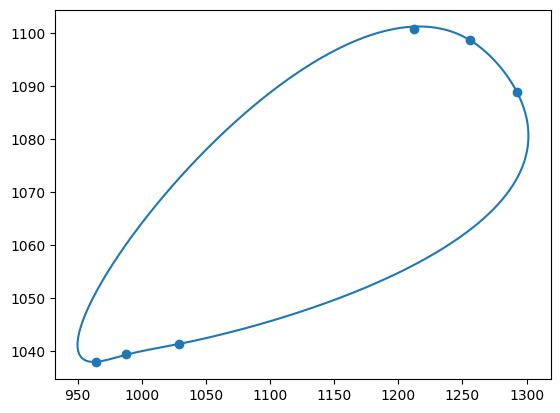

In [55]:
import numpy as np
from scipy.interpolate import splprep, splev
import matplotlib.pyplot as plt

# Generate some data points that form a closed shape
x = np.array(all_x)
y = np.array(all_y)

tck, _ = splprep([x, y], s = 1, per = True)
xx, yy = splev(np.linspace(0, 1, 10000), tck, der = 0)
print("x",xx)
print("y",yy)
plt.scatter(x, y)
plt.plot(xx, yy)
plt.show()